In [7]:
import pandas as pd
import numpy as np
import scipy
from matplotlib import pyplot as plt
import seaborn as sns
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
from sklearn import metrics
from sklearn.cluster import KMeans

## Functions

In [8]:
# %load plot_clustered_ts.py
def plot_clustered_ts(timeSeries,clusters, anim, plot = True):
    %matplotlib inline
    from scipy.cluster.hierarchy import fcluster, linkage
    import math
    import time

    results = clusters
    #print(results)
    # check the results
    s = pd.Series(results)
    #print("s:",s)
    clusters = sorted(s.unique())
    #print("clusters", clusters)
    if anim == True:
        %matplotlib

    fig = plt.figure(1, figsize = (15,10))
    for i, c in enumerate(clusters):
        
        #print("i", i)
        #print("cluster", c)

        cluster_indeces = s[s==c].index
        #print("cluster_indeces", cluster_indeces)
        print("Number of cycles in cluster {}: {}".format(c, len(cluster_indeces)))
        if plot:
            with plt.style.context(('bmh')):
                x = math.ceil(k/2)
                ax = fig.add_subplot(x,2,i+1)
                if anim == True:
                    axes = fig.add_subplot(x,2,i+1)

                    for cluster_index in cluster_indeces:
                        axes = plt.gca()
                        limmax = 3
                        limmin = -3
                        axes.set_ylim(limmin, limmax)
                        #print("cluster_index", cluster_index)
                        #print(timeSeries.T.loc[:,cluster_index])
                        plt.plot(timeSeries.T.loc[:,cluster_index], marker = ".",label = cluster_index)
                        plt.draw()
                        plt.pause(0.1)
                        
                        #plt.legend(frameon=False, loc='lower right', ncol=2)

                else:
                    with plt.style.context(('bmh')):
                        x = math.ceil(k/2)
                        ax = fig.add_subplot(x,2,i+1)


                        %matplotlib inline
                        for cluster_index in range(len(cluster_indeces)):
                                
                            axes = plt.gca()
                            limmax = 3
                            limmin = -3
                            axes.set_ylim(limmin, limmax)
                            ax.plot(timeSeries.loc[:,cluster_index], marker = ".",label = cluster_index)



        else:
            print("Cluster %d - number of entries %d" % (c, len(cluster_indeces)))
    return results

In [9]:
# %load cycle_transform.py
def cycle_transform(df, value, save = True):

    value_ = df[["cycle_day", value, "cycle_index"]]
    #print(sorted(value_.cycle_index.unique()))

    value_zero = value_.pivot_table(index = "cycle_day", columns="cycle_index", values = value_).fillna(0)
    #print("value_zero:",value_zero)
    value_nan = value_.pivot_table(index = "cycle_day", columns="cycle_index", values = value_)

    if save == True:
        value_zero.to_csv("Data/"+value+"_zero.csv")
        value_nan.to_csv("Data/"+value+"_nan.csv")
    return value_zero, value_nan

In [10]:
#Create a new function:
def num_missing(x):
    return sum(x.isnull())

#Applying per column:
print("Missing values per column:")
print(df.apply(num_missing, axis=0)) #axis=0 defines that function is to be applied on each column


Missing values per column:


NameError: name 'df' is not defined

## Data

In [11]:
#missing days interpolated
md = pd.read_csv("Data/missingdays_interpolated.csv")
#complete cycles
cc = pd.read_csv("Data/data_clean2.csv")


cc = cc.drop(["Unnamed: 0", "level_0", "br_stan","hr_stan","st_stan","index","date"], axis =1)
md = md.drop(["date.1","date"],axis =1)
df_regLen = pd.concat([cc,md], ignore_index=True)
groupby_cycles = df_regLen.groupby(["cycle_index","user","cycle_number"]).mean()
groupby_cycles
user_cycle_df = pd.DataFrame(groupby_cycles.reset_index()[["cycle_index", "user", "cycle_number", "cycle_length"]])

user_cycle_df["cycle_length"] = user_cycle_df["cycle_length"].astype(int)
user_cycle_df

df_ = df_regLen


##################################################################
orig_feature = "hr_norm"

hr_norm_zero, hr_norm_nan = cycle_transform(df_, orig_feature, False)

hr_zero, hr_nan = cycle_transform(df_, orig_feature[:2], False)

In [326]:
df = pd.read_csv("Data/data_clean2.csv") # = cc 
len(df_regLen)

16042

In [12]:
features = df_regLen[df_regLen.cycle_length == 29]

features = features[["cycle_index","cycle_day", "hr_norm"]]

features.cycle_index.unique()



array([ 22,  24,  27,  52,  57,  81, 126, 175, 210, 211, 214, 230, 236,
       253, 277, 482, 490, 542, 625, 633, 651, 692, 719, 725, 780, 782,
        23,  26,  30,  48,  54,  83,  84,  93,  99, 147, 196, 209, 225,
       250, 282, 286, 287, 352, 360, 367, 379, 393, 452, 468, 475, 496,
       498, 500, 504, 541, 548, 576, 604, 629, 712, 716, 734, 790])

In [13]:
### perform extraction, imputing and filtering at the same time
from tsfresh import extract_features

features_ = extract_features(features, column_id='cycle_index', column_sort='cycle_day')
features_.hr_norm__last_location_of_minimum

/anaconda3/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools
Feature Extraction: 100%|██████████| 16/16 [00:01<00:00, 10.57it/s]


id
22     0.344828
23     0.137931
24     0.206897
26     0.310345
27     0.620690
30     0.333333
48     0.068966
52     0.241379
54     0.275862
57     0.344828
81     0.275862
83     0.103448
84     0.310345
93     0.392857
99     0.172414
126    0.068966
147    0.103448
175    0.206897
196    0.206897
209    0.241379
210    0.620690
211    0.241379
214    0.310345
225    0.241379
230    0.103448
236    0.413793
250    0.137931
253    0.413793
277    0.206897
282    0.379310
         ...   
367    0.172414
379    0.034483
393    0.586207
452    0.448276
468    0.965517
475    0.241379
482    0.310345
490    0.344828
496    0.448276
498    0.172414
500    0.413793
504    0.137931
541    0.241379
542    0.310345
548    0.137931
576    0.821429
604    0.413793
625    1.000000
629    0.620690
633    0.724138
651    0.517241
692    0.034483
712    0.241379
716    0.275862
719    0.482759
725    0.517241
734    0.172414
780    0.275862
782    0.034483
790    0.586207
Name: hr_norm__last_l

In [15]:
features_



list_extracted_features = ["kurtosis", "last_location_of_maximum", "last_location_of_minimum",\
                           "longest_strike_above_mean","longest_strike_below_mean", "maximum", "mean", "median",\
                           "minimum",  "sample_entropy", "skewness",\
                           "standard_deviation", "variance"]

#"number_cwt_peaks","number_peaks",  "length"
new = [orig_feature+ "__" + s for s in list_extracted_features]
#print(new)
choosen_features = features_[new]

#Applying per column:
print("Missing values per column:")
missing = choosen_features.apply(num_missing, axis=0)
print(missing)#axis=0 defines that function is to be applied on each column

choosen_features

Missing values per column:
variable
hr_norm__kurtosis                     0
hr_norm__last_location_of_maximum     0
hr_norm__last_location_of_minimum     0
hr_norm__longest_strike_above_mean    0
hr_norm__longest_strike_below_mean    0
hr_norm__maximum                      0
hr_norm__mean                         0
hr_norm__median                       0
hr_norm__minimum                      0
hr_norm__sample_entropy               0
hr_norm__skewness                     0
hr_norm__standard_deviation           0
hr_norm__variance                     0
dtype: int64


variable,hr_norm__kurtosis,hr_norm__last_location_of_maximum,hr_norm__last_location_of_minimum,hr_norm__longest_strike_above_mean,hr_norm__longest_strike_below_mean,hr_norm__maximum,hr_norm__mean,hr_norm__median,hr_norm__minimum,hr_norm__sample_entropy,hr_norm__skewness,hr_norm__standard_deviation,hr_norm__variance
id,,,,,,,,,,,,,
22,-0.936930,1.000000,0.344828,12.0,13.0,1.940713,-4.119310e-15,0.351688,-1.916880,2.017369,-0.329469,0.982607,0.965517
23,-0.982608,0.413793,0.137931,17.0,8.0,1.150198,-1.404161e-02,0.209487,-1.942825,2.094330,-0.516788,0.967758,0.936555
24,-1.290813,0.931034,0.206897,13.0,11.0,1.478004,-9.034918e-16,0.033686,-1.566932,2.245153,-0.147750,0.982607,0.965517
26,-1.090259,1.000000,0.310345,7.0,10.0,1.412615,-3.897307e-02,0.143740,-1.945528,2.222164,-0.458441,0.986693,0.973564
27,-1.165906,0.068966,0.620690,9.0,13.0,1.959052,5.838242e-15,0.200210,-1.558113,2.017369,0.007238,0.982607,0.965517
30,-1.428660,0.888889,0.333333,10.0,14.0,1.672045,5.696185e-02,-0.012333,-1.310478,2.032145,0.218779,1.005130,1.010287
48,-0.537086,0.586207,0.068966,17.0,8.0,1.496368,-4.669339e-03,0.244412,-2.251661,2.135152,-0.626453,0.965218,0.931645
52,-1.039251,0.793103,0.241379,15.0,11.0,1.388421,-5.355869e-15,0.437921,-1.806542,2.036061,-0.548180,0.982607,0.965517
54,-0.856273,0.068966,0.275862,15.0,10.0,1.467090,-1.370380e-01,0.088290,-2.151081,2.135152,-0.657053,1.072511,1.150280


In [16]:
#features = features_.dropna(axis=1, how='any')
features_ = choosen_features
print(features_.shape)
features.shape
#features_new = features.where(features != 0).dropna(axis = 1, how = "any")
#print(features_new.shape)
#features_finite = features_new.replace([np.inf, -np.inf], np.nan)
#print(features_finite.shape)

#features_finite2 = features_new.replace([np.inf, -np.inf], np.nan).dropna(axis = 1, how = "any")
#print(features_finite2.shape)
features_finite2 = features_

(64, 13)


## Position and Value of Min and Max in a cycle

In [208]:
df_regLen[df_regLen.cycle_length == 29].groupby("cycle_index").max()
pos_min = []
pos_max = []
cycle_max = []
cycle_min = []
cycle_len = []
cycle_index = []
for cycle in df_regLen.cycle_index.unique():
    df_temp = df_regLen[df_regLen.cycle_index == cycle].reset_index()
    cycle_index.append(int(df_temp.cycle_index.mean()))
    pos_min.append(df_temp.hr_norm.argmin())
    pos_max.append(df_temp.hr_norm.argmax())
    cycle_max.append(df_temp.hr_norm.max())
    cycle_min.append(df_temp.hr_norm.min())
    cycle_len.append(int(df_temp.cycle_length.mean()))

In [209]:
min_max_position = {"pos_min" : pos_min, "cycle_min":cycle_min,
          "pos_max" : pos_max, "cycle_max":cycle_max,
          "cycle_len": cycle_len, "cycle_index": cycle_index}

min_max_position = pd.DataFrame(min_max_position)
min_max_position.head()

,cycle_index,cycle_len,cycle_max,cycle_min,pos_max,pos_min
0,3,34,2.382341,-1.237442,32,5
1,5,34,2.105193,-1.144268,32,6
2,21,28,1.940495,-1.479597,19,3
3,22,29,1.940713,-1.916880,28,9
4,24,29,1.478004,-1.566932,26,5


### k-means on min and max

In [345]:
cluster_data = min_max_position.iloc[:, 1:]
cluster_data = cluster_data[cluster_data.cycle_len == 29].values



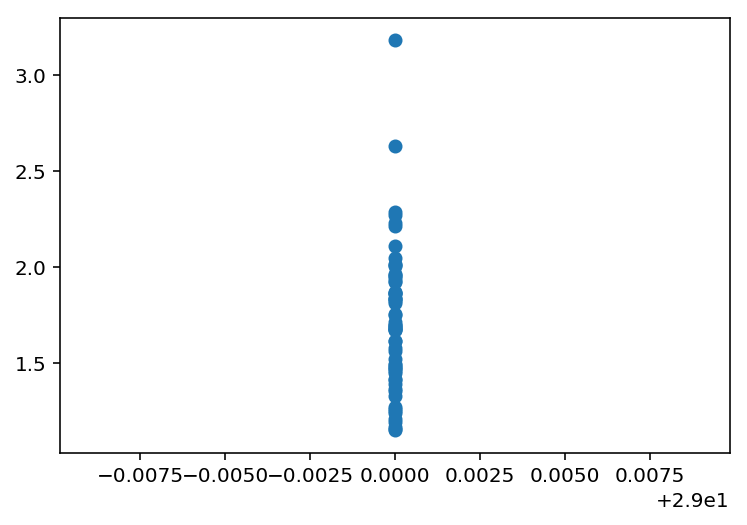

In [346]:
k = 6

kmeans = KMeans(init='k-means++', n_clusters=6, n_init=10)

kmeans.fit(cluster_data)

plt.scatter(cluster_data[:,0],cluster_data[:,1])

centroids = kmeans.cluster_centers_
#print(centroids)
labels = kmeans.labels_
#print(labels)

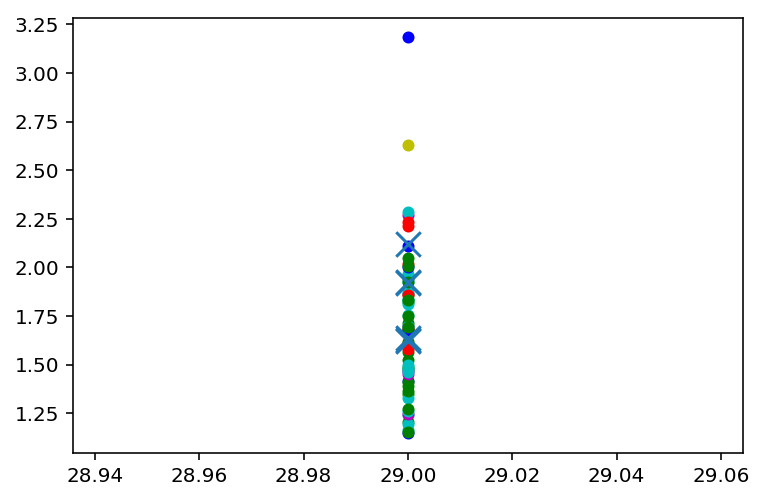

In [347]:
colors = ['b.', 'g.', 'r.', 'c.', 'm.', 'y.', 'k.', 'w.']
X = cluster_data
for i in range(len(X)):
    
    #print("coordinate:",X[i][0], "label:", labels[i])
    #print("X", X[i][0])
    #print("label", colors[labels[i]])
    plt.plot(X[i][0], X[i][1], colors[labels[i]], markersize = 10)


plt.scatter(centroids[:, 0],centroids[:, 1], marker = "x", s=150, linewidths = 5, zorder = 10)

In [348]:
index = min_max_position[min_max_position.cycle_len == 29].cycle_index.values
#print(len(index))
#print(len(labels))
cluster_indeces = pd.concat([pd.Series(labels).rename("cluster"), pd.Series(index).rename("cycle_index")], axis = 1)
#print(cluster_indeces)
cluster_indeces = cluster_indeces.set_index("cycle_index")
cluster_indeces.head()

,cluster
cycle_index,
22,1
24,1
27,2
52,1
57,3


Using matplotlib backend: MacOSX


/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


cycle_index
22     1
24     1
27     2
52     1
57     3
81     1
126    0
175    3
210    2
211    1
214    1
230    1
236    1
253    1
277    3
482    3
490    1
542    1
625    5
633    2
651    2
692    3
719    4
725    2
780    3
782    3
23     0
26     1
30     1
48     3
      ..
99     3
147    0
196    3
209    3
225    1
250    3
282    1
286    4
287    1
352    1
360    0
367    1
379    0
393    2
452    1
468    5
475    3
496    4
498    1
500    3
504    3
541    3
548    1
576    2
604    3
629    1
712    1
716    1
734    0
790    2
Name: cluster, Length: 64, dtype: int32

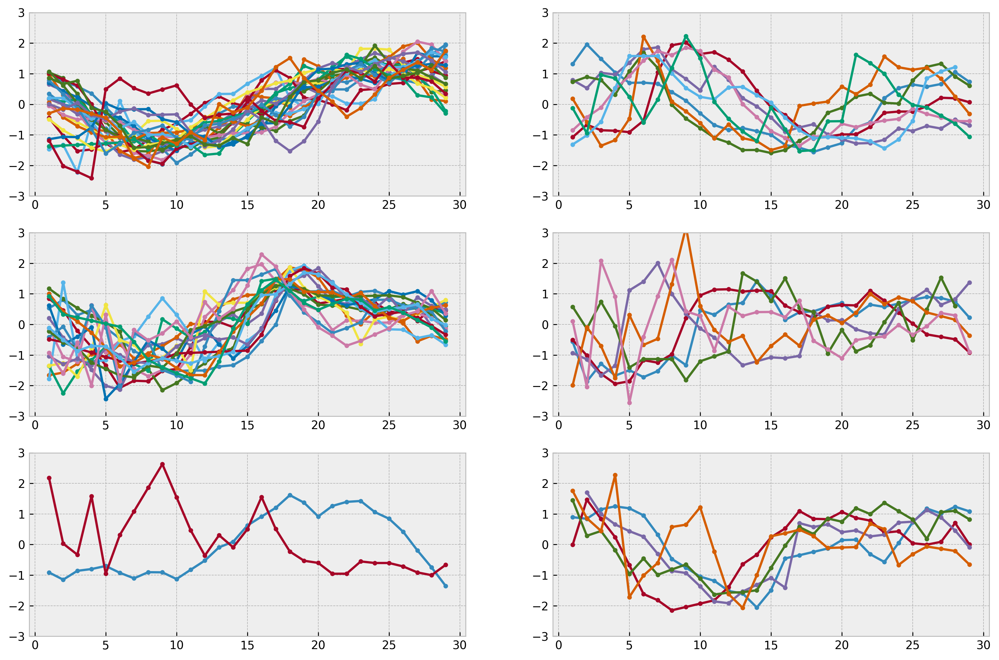

ERROR:tornado.application:Exception in callback functools.partial(<function wrap.<locals>.null_wrapper at 0x12820bea0>)
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/tornado/ioloop.py", line 605, in _run_callback
    ret = callback()
  File "/anaconda3/lib/python3.6/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 265, in enter_eventloop
    self.eventloop(self)
  File "/anaconda3/lib/python3.6/site-packages/ipykernel/eventloops.py", line 277, in loop_cocoa
    show.mainloop()
AttributeError: 'function' object has no attribute 'mainloop'


In [349]:
timeSeries = hr_norm_nan.hr_norm.T
timeSeries
plot_clustered_ts(timeSeries,cluster_indeces["cluster"],anim = True, plot = True)

### hierarchical clustering on min and max

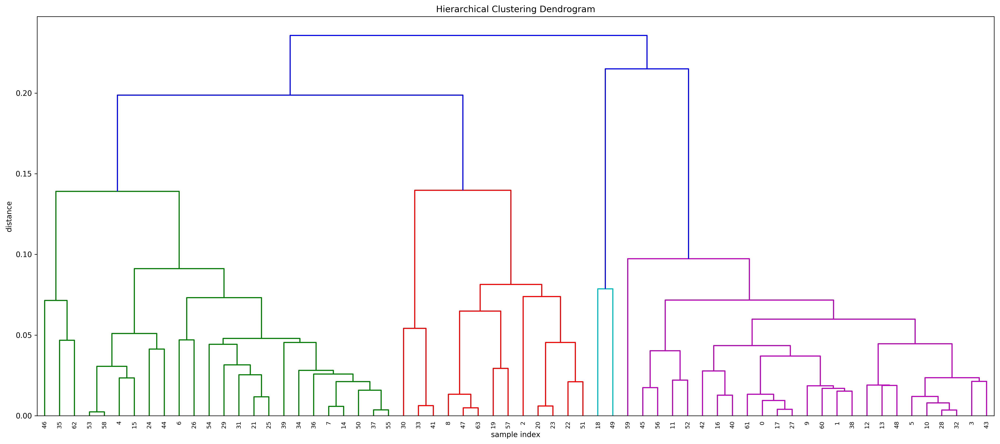

In [313]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import numpy as np

# generate the linkage matrix
Z = linkage(cluster_data, 'weighted',"braycurtis")

# calculate full dendrogram
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()

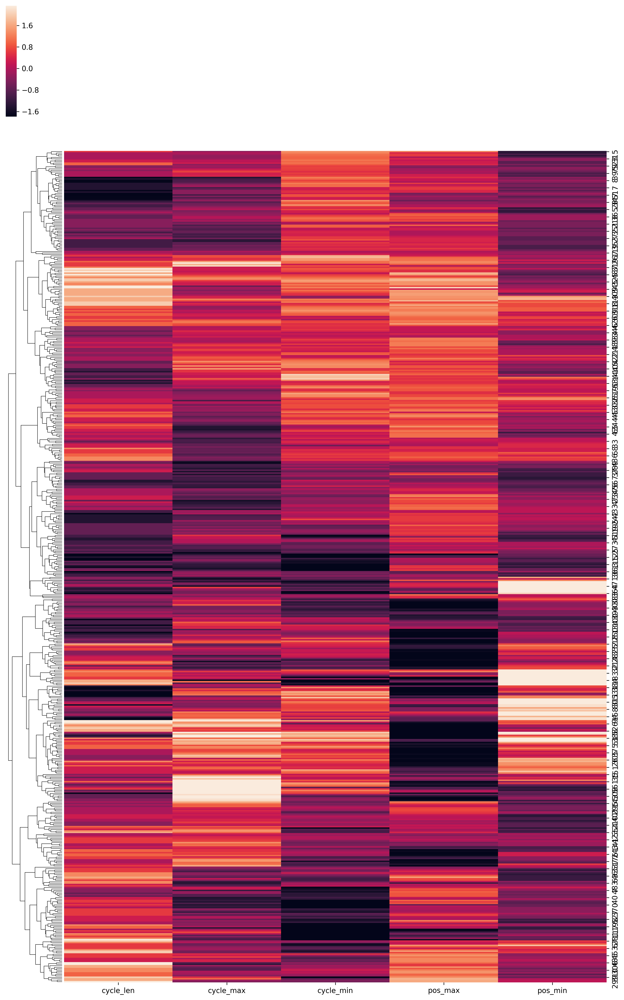

In [314]:
sns.clustermap(min_max_position.iloc[:, 1:], z_score = 1, robust = True, col_cluster= False, method = "weighted", metric = "braycurtis", figsize = (15,25))

In [315]:
k=8
clusters_hierarchical = fcluster(Z, k, criterion='maxclust')
clusters_hierarchical

array([7, 7, 5, 7, 2, 7, 3, 3, 5, 7, 7, 7, 7, 7, 3, 2, 7, 7, 6, 5, 5, 3, 5,
       5, 2, 3, 3, 7, 7, 3, 4, 3, 7, 4, 3, 1, 3, 3, 7, 3, 7, 4, 7, 7, 2, 7,
       1, 5, 7, 6, 3, 5, 7, 2, 3, 3, 7, 5, 2, 8, 7, 7, 1, 5], dtype=int32)

In [316]:
index = min_max_position[min_max_position.cycle_len == 29].cycle_index.values
#print(len(index))
#print(len(labels))
cluster_indeces = pd.concat([pd.Series(clusters_hierarchical).rename("cluster"), pd.Series(index).rename("cycle_index")], axis = 1)
#print(cluster_indeces)
cluster_indeces = cluster_indeces.set_index("cycle_index")
cluster_indeces.head()

,cluster
cycle_index,
22,7
24,7
27,5
52,7
57,2


Using matplotlib backend: MacOSX


/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


cycle_index
22     7
24     7
27     5
52     7
57     2
81     7
126    3
175    3
210    5
211    7
214    7
230    7
236    7
253    7
277    3
482    2
490    7
542    7
625    6
633    5
651    5
692    3
719    5
725    5
780    2
782    3
23     3
26     7
30     7
48     3
      ..
99     3
147    1
196    3
209    3
225    7
250    3
282    7
286    4
287    7
352    7
360    2
367    7
379    1
393    5
452    7
468    6
475    3
496    5
498    7
500    2
504    3
541    3
548    7
576    5
604    2
629    8
712    7
716    7
734    1
790    5
Name: cluster, Length: 64, dtype: int32

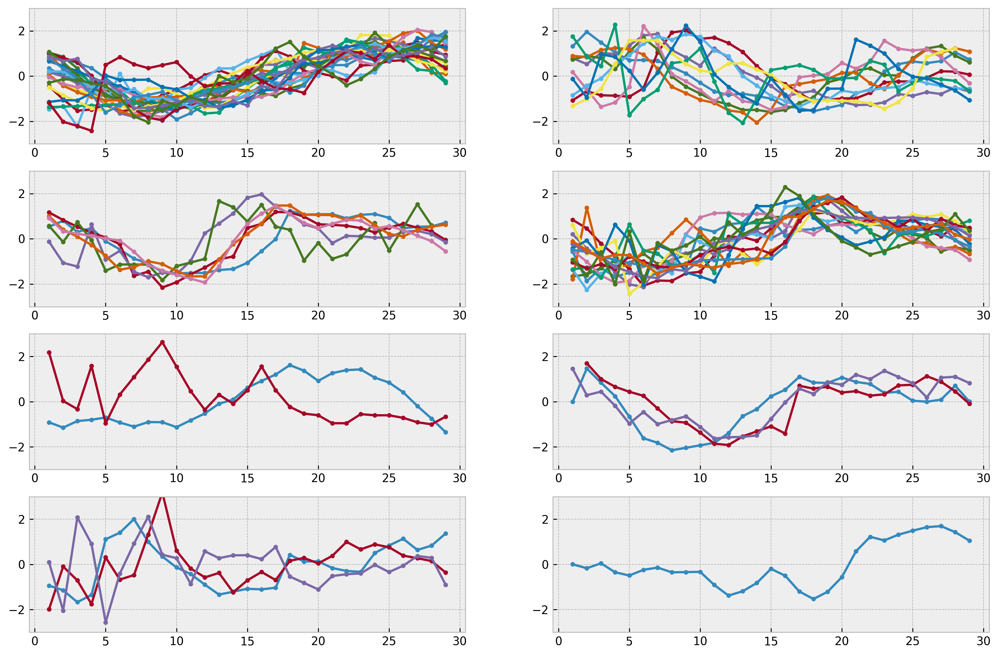

ERROR:tornado.application:Exception in callback functools.partial(<function wrap.<locals>.null_wrapper at 0x1287fbd90>)
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/tornado/ioloop.py", line 605, in _run_callback
    ret = callback()
  File "/anaconda3/lib/python3.6/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 265, in enter_eventloop
    self.eventloop(self)
  File "/anaconda3/lib/python3.6/site-packages/ipykernel/eventloops.py", line 277, in loop_cocoa
    show.mainloop()
AttributeError: 'function' object has no attribute 'mainloop'
ERROR:tornado.application:Exception in callback functools.partial(<function wrap.<locals>.null_wrapper at 0x1287fb2f0>)
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/tornado/ioloop.py", line 605, in _run_callback
    ret = callback()
  File "/anaconda3/lib/

In [317]:
plot_clustered_ts(timeSeries,cluster_indeces["cluster"],anim = True, plot = True)

## k-means of tsfresh features

In [357]:
cluster_data = features_finite2.iloc[:, :].values


[[ -9.27562770e-01   8.14655172e-01   3.75000000e-01   1.02500000e+01
    1.67500000e+01   1.86476074e+00  -4.27405700e-02  -3.89910692e-01
   -1.37328234e+00   2.06900198e+00   5.73754877e-01   9.67228648e-01
    9.35661837e-01]
 [  6.63049846e-02   5.90038314e-01   1.72413793e-01   9.55555556e+00
    6.55555556e+00   2.03361034e+00   1.75120774e-02   8.59499967e-02
   -1.92774453e+00   2.17318071e+00  -4.66911733e-02   9.75039298e-01
    9.50827746e-01]
 [ -1.23121218e+00   7.29459344e-01   3.69093231e-01   1.24444444e+01
    1.39444444e+01   1.60278493e+00  -1.09791033e-02   2.57137990e-02
   -1.58196265e+00   2.07532361e+00  -2.24534505e-02   9.84495946e-01
    9.69356773e-01]
 [ -9.12454773e-01   5.60344828e-01   2.66154738e-01   1.50000000e+01
    1.01764706e+01   1.42852370e+00  -7.83433608e-03   2.60090825e-01
   -1.86232061e+00   2.08353251e+00  -4.63808039e-01   9.81567532e-01
    9.64302895e-01]
 [ -1.59856066e-01   2.85960591e-01   3.26354680e-01   5.40000000e+00
    7.4000

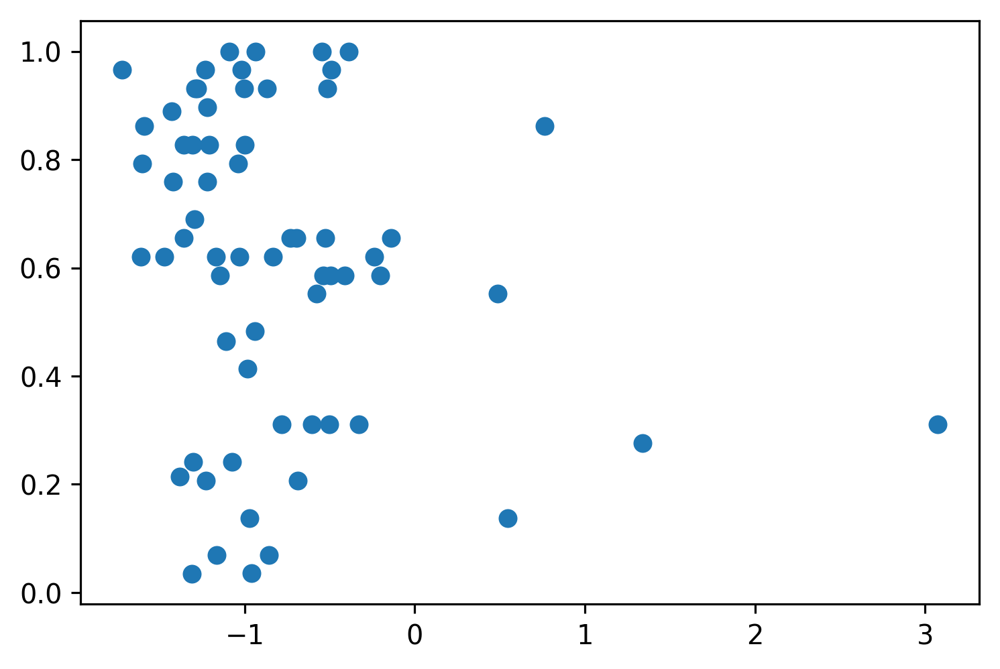

In [358]:
k = 6

kmeans = KMeans(init='k-means++', n_clusters=6, n_init=10)

kmeans.fit(cluster_data)

plt.scatter(cluster_data[:,0],cluster_data[:,1])

centroids = kmeans.cluster_centers_
print(centroids)
labels = kmeans.labels_
print(labels)

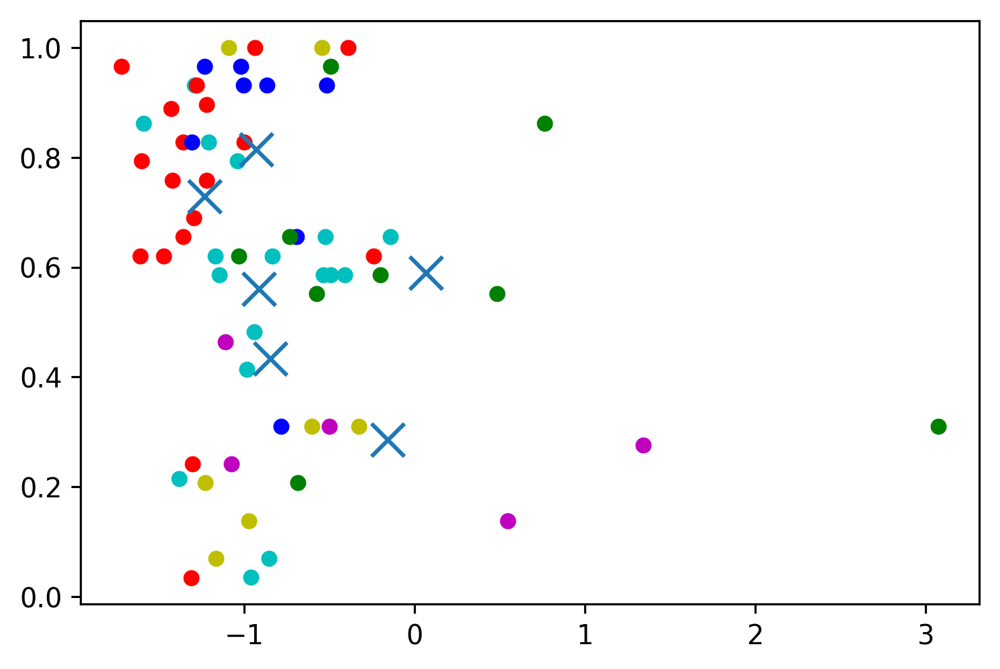

In [359]:
colors = ['b.', 'g.', 'r.', 'c.', 'm.', 'y.', 'k.', 'w.']
X = cluster_data
for i in range(len(X)):
    
    #print("coordinate:",X[i][0], "label:", labels[i])
    #print("X", X[i][0])
    #print("label", colors[labels[i]])
    plt.plot(X[i][0], X[i][1], colors[labels[i]], markersize = 10)


plt.scatter(centroids[:, 0],centroids[:, 1], marker = "x", s=150, linewidths = 5, zorder = 10)

In [360]:
cluster_indeces = pd.concat([pd.DataFrame(labels), pd.DataFrame(features_finite2.index)], axis = 1)
cluster_indeces["cluster"] = cluster_indeces[0]
cluster_indeces = cluster_indeces.drop(0, axis = 1).set_index("id")
cluster_indeces.head()

,cluster
id,
22,2
23,3
24,3
26,5
27,5


Using matplotlib backend: MacOSX
Number of cycles in cluster 0: 8


/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Number of cycles in cluster 1: 9
Number of cycles in cluster 2: 18
Number of cycles in cluster 3: 17
Number of cycles in cluster 4: 5
Number of cycles in cluster 5: 7


id
22     2
23     3
24     3
26     5
27     5
30     2
48     3
52     3
54     3
57     2
81     2
83     1
84     0
93     3
99     2
126    3
147    4
175    3
196    1
209    0
210    5
211    2
214    3
225    0
230    1
236    2
250    2
253    2
277    3
282    0
      ..
367    3
379    1
393    0
452    2
468    5
475    3
482    3
490    2
496    4
498    0
500    3
504    1
541    2
542    2
548    1
576    3
604    3
625    2
629    0
633    2
651    5
692    3
712    2
716    5
719    5
725    1
734    4
780    1
782    1
790    4
Name: cluster, Length: 64, dtype: int32

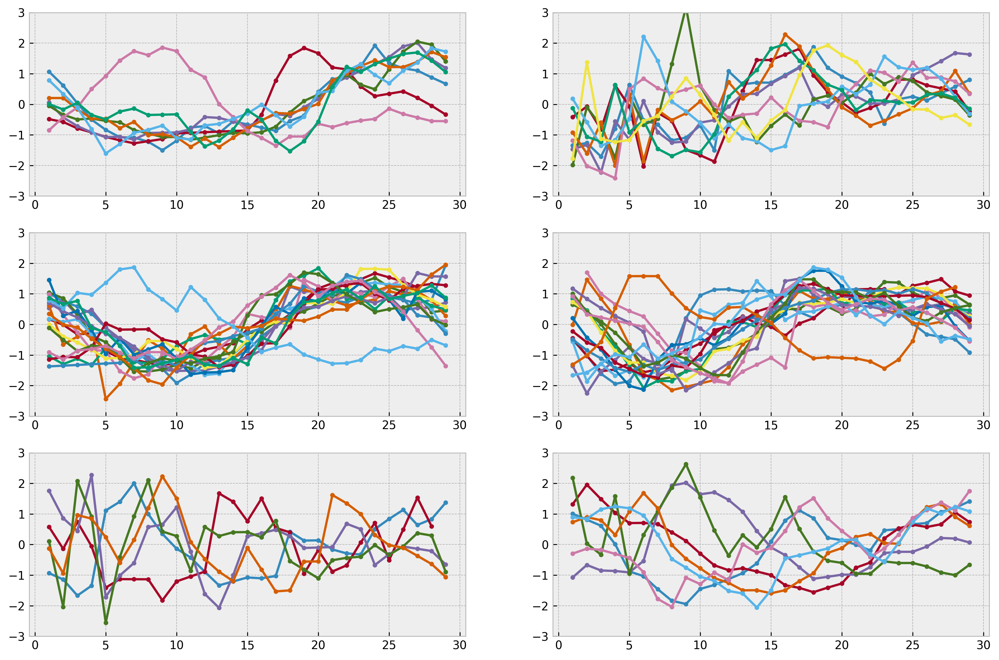

ERROR:tornado.application:Exception in callback functools.partial(<function wrap.<locals>.null_wrapper at 0x128824488>)
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/tornado/ioloop.py", line 605, in _run_callback
    ret = callback()
  File "/anaconda3/lib/python3.6/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 265, in enter_eventloop
    self.eventloop(self)
  File "/anaconda3/lib/python3.6/site-packages/ipykernel/eventloops.py", line 277, in loop_cocoa
    show.mainloop()
AttributeError: 'function' object has no attribute 'mainloop'
ERROR:tornado.application:Exception in callback functools.partial(<function wrap.<locals>.null_wrapper at 0x128824378>)
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/tornado/ioloop.py", line 605, in _run_callback
    ret = callback()
  File "/anaconda3/lib/

In [361]:
timeSeries = hr_norm_nan.hr_norm.T
timeSeries
plot_clustered_ts(timeSeries,cluster_indeces["cluster"],anim = True, plot = True)

## hierarchical clustering on tsfresh features

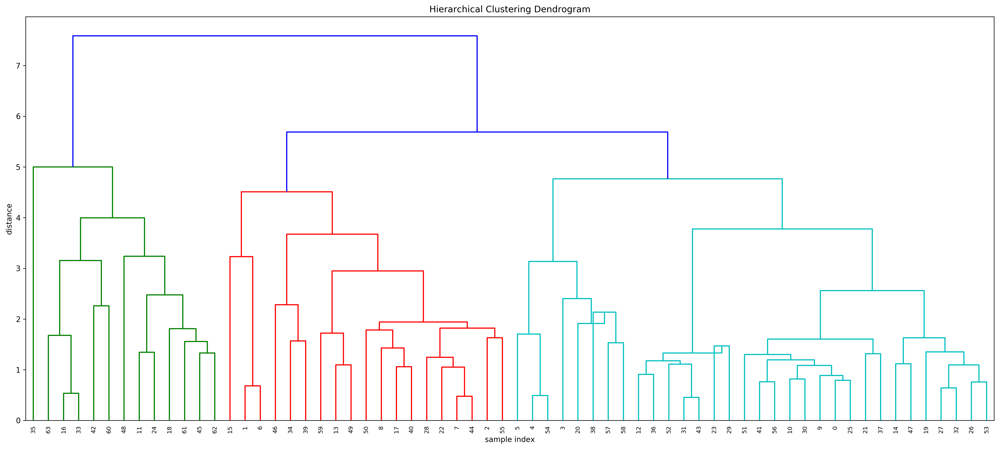

In [372]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import numpy as np

# generate the linkage matrix
Z = linkage(cluster_data, 'centroid',"euclidean")

# calculate full dendrogram
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()

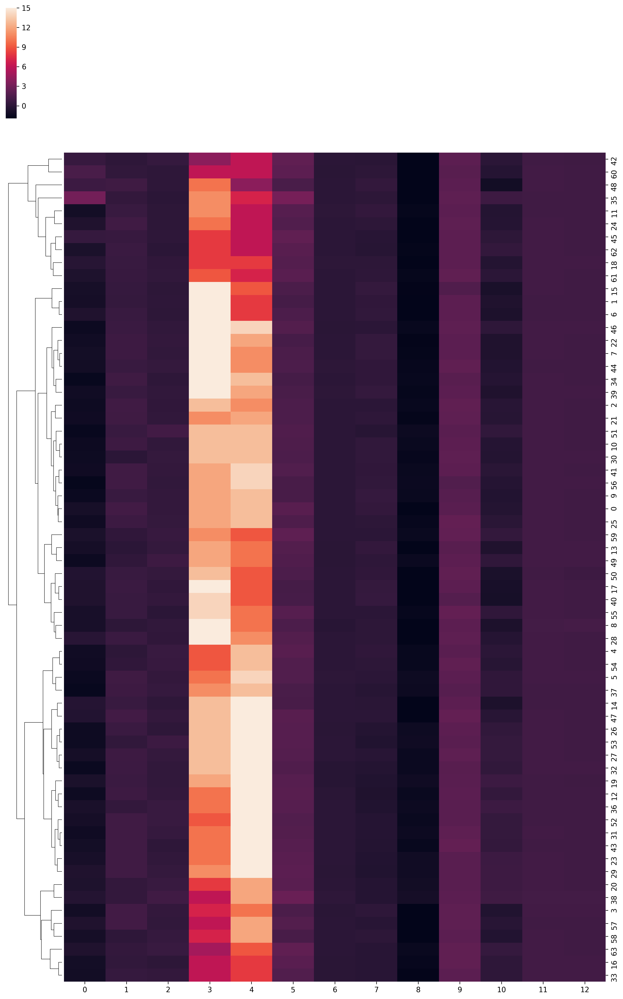

In [373]:
sns.clustermap(cluster_data, robust = True, col_cluster= False, method = "complete", metric = "braycurtis", figsize = (15,25))

In [374]:
k=6
clusters_hierarchical = fcluster(Z, k, criterion='maxclust')
clusters_hierarchical

array([6, 3, 4, 5, 5, 5, 3, 4, 4, 6, 6, 1, 6, 4, 6, 3, 1, 4, 1, 6, 5, 6, 4,
       6, 1, 6, 6, 6, 4, 6, 6, 6, 6, 1, 4, 2, 6, 6, 5, 4, 4, 6, 1, 6, 4, 1,
       4, 6, 1, 4, 4, 6, 6, 6, 5, 4, 6, 5, 5, 4, 1, 1, 1, 1], dtype=int32)

In [375]:
cluster_indeces = pd.concat([pd.DataFrame(clusters_hierarchical), pd.DataFrame(features_finite2.index)], axis = 1)
cluster_indeces["cluster"] = cluster_indeces[0]
cluster_indeces = cluster_indeces.drop(0, axis = 1).set_index("id")
cluster_indeces.head()

,cluster
id,
22,6
23,3
24,4
26,5
27,5


Using matplotlib backend: MacOSX
Number of cycles in cluster 1: 12


/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Number of cycles in cluster 2: 1
Number of cycles in cluster 3: 3
Number of cycles in cluster 4: 16
Number of cycles in cluster 5: 8
Number of cycles in cluster 6: 24


id
22     6
23     3
24     4
26     5
27     5
30     5
48     3
52     4
54     4
57     6
81     6
83     1
84     6
93     4
99     6
126    3
147    1
175    4
196    1
209    6
210    5
211    6
214    4
225    6
230    1
236    6
250    6
253    6
277    4
282    6
      ..
367    4
379    2
393    6
452    6
468    5
475    4
482    4
490    6
496    1
498    6
500    4
504    1
541    4
542    6
548    1
576    4
604    4
625    6
629    6
633    6
651    5
692    4
712    6
716    5
719    5
725    4
734    1
780    1
782    1
790    1
Name: cluster, Length: 64, dtype: int32

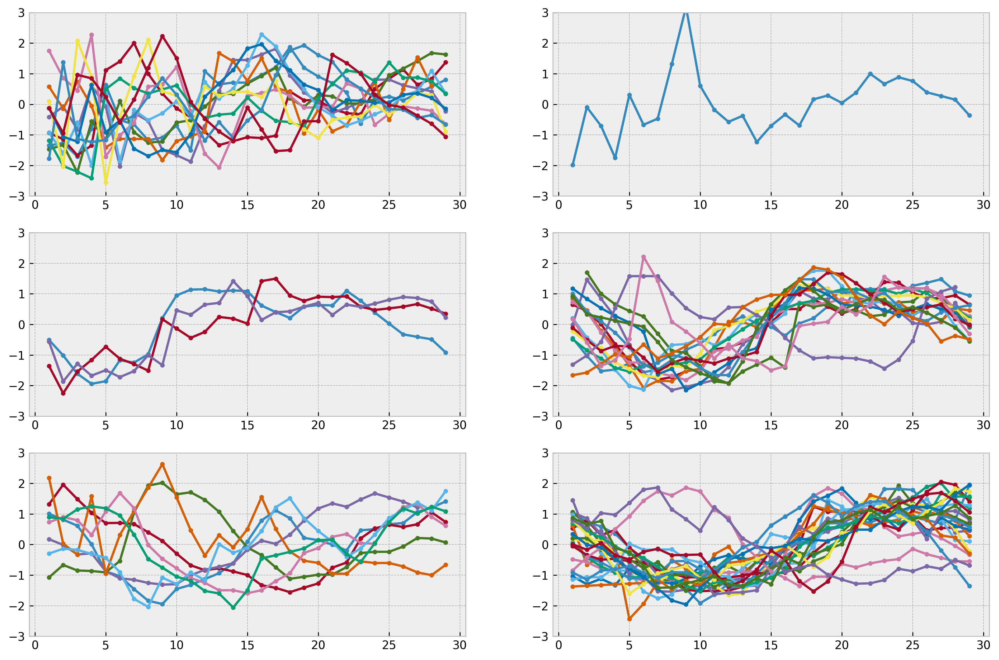

ERROR:tornado.application:Exception in callback functools.partial(<function wrap.<locals>.null_wrapper at 0x126f0f6a8>)
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/tornado/ioloop.py", line 605, in _run_callback
    ret = callback()
  File "/anaconda3/lib/python3.6/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 265, in enter_eventloop
    self.eventloop(self)
  File "/anaconda3/lib/python3.6/site-packages/ipykernel/eventloops.py", line 277, in loop_cocoa
    show.mainloop()
AttributeError: 'function' object has no attribute 'mainloop'
ERROR:tornado.application:Exception in callback functools.partial(<function wrap.<locals>.null_wrapper at 0x123a688c8>)
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/tornado/ioloop.py", line 605, in _run_callback
    ret = callback()
  File "/anaconda3/lib/

In [376]:
plot_clustered_ts(timeSeries,cluster_indeces["cluster"],anim = True, plot = True)

# PCA

In [108]:
# PCA 
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

In [109]:
reduced_data = PCA(n_components=10).fit_transform(features_finite2)
len(reduced_data)

64

### k-means clustering of 5 componant PCA

[[ -2.22695701e+02  -6.82192308e+01  -4.90373608e+01  -1.40306131e+01
    3.24038826e+01  -3.81776855e+01   6.98583600e+01  -3.75269963e+01
   -2.01889732e+01   2.71632704e+01]
 [  2.17813260e+02  -3.50513078e+01  -4.14303521e+01  -5.92974400e+01
   -6.07577344e+00  -2.84508102e+01  -6.89764109e+00  -5.07242223e+01
   -2.24515803e+01   1.30673732e+00]
 [ -1.31136373e+02   1.25644931e+03  -1.29253383e+02  -1.20769300e+02
    2.05245351e+01  -4.71009278e+01   5.04919962e+01  -1.05275281e+02
   -2.15034351e+01  -5.98577854e+01]
 [ -9.84568037e+01  -1.05440310e-01   2.01960841e+02  -4.49696442e+01
   -4.53555186e+01   5.88085878e+01  -6.34471541e+01  -7.16680958e+00
   -3.68345649e+01  -1.54735165e+01]
 [ -4.32119396e+01  -8.85236185e+00  -1.68530952e+02   7.70906130e+01
    3.36000955e+01   5.13390038e+01  -9.94985372e+01   6.51244882e+01
   -1.15741274e+00  -1.60075788e+01]
 [  9.10089879e+01   1.75609835e+01   6.08524726e+01   6.54563448e+01
   -1.34091898e+01  -1.35793937e+01   5.98370

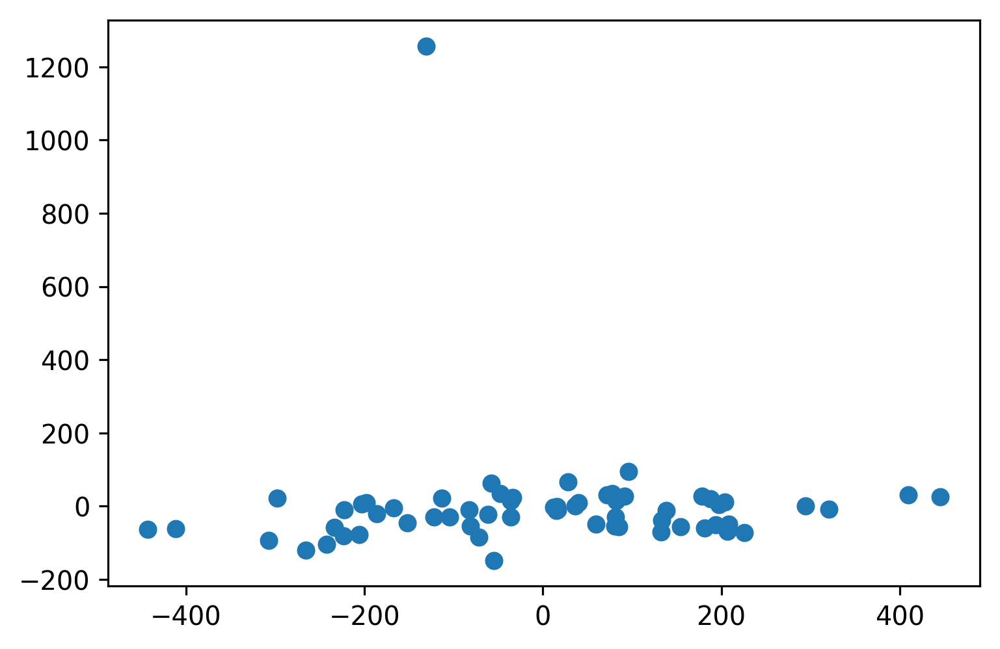

In [110]:
kmeans = KMeans(init='k-means++', n_clusters=6, n_init=10)
kmeans.fit(reduced_data)

plt.scatter(reduced_data[:,0],reduced_data[:,1])

centroids = kmeans.cluster_centers_
print(centroids)
labels = kmeans.labels_
print(labels)

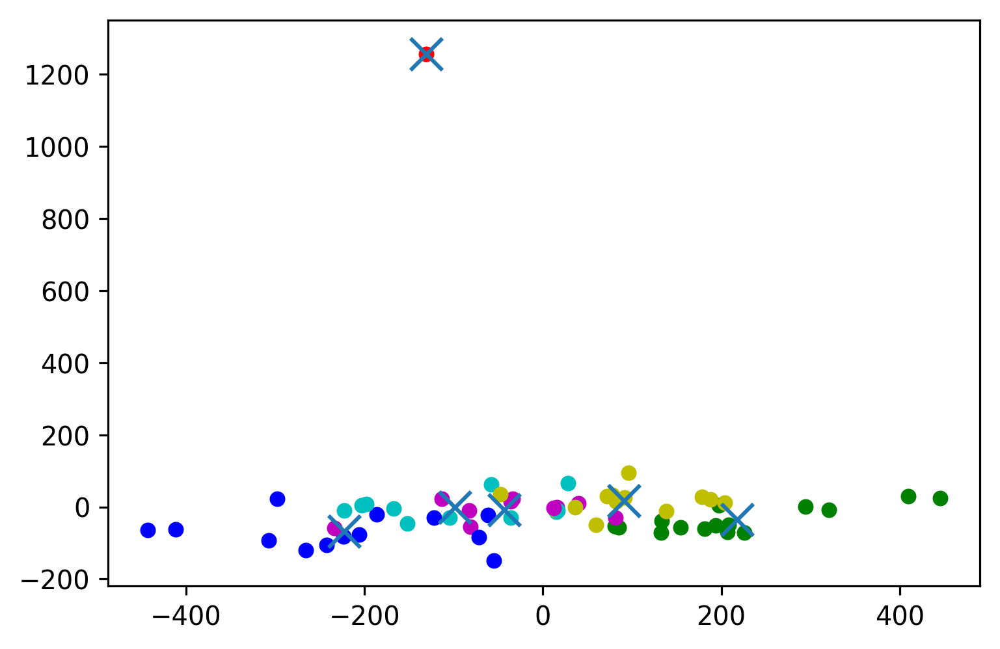

In [111]:
colors = ['b.', 'g.', 'r.', 'c.', 'm.', 'y.', 'k.', 'w.']
X = reduced_data
for i in range(len(X)):
    
    #print("coordinate:",X[i][0], "label:", labels[i])
    #print("X", X[i][0])
    #print("label", colors[labels[i]])
    plt.plot(X[i][0], X[i][1], colors[labels[i]], markersize = 10)


plt.scatter(centroids[:, 0],centroids[:, 1], marker = "x", s=150, linewidths = 5, zorder = 10)

In [112]:
cluster_indeces = pd.concat([pd.DataFrame(labels), pd.DataFrame(features_finite2.index)], axis = 1)
cluster_indeces["cluster"] = cluster_indeces[0]
cluster_indeces = cluster_indeces.drop(0, axis = 1).set_index("id")
cluster_indeces.head()

,cluster
id,
22,0
23,3
24,0
26,5
27,1


Using matplotlib backend: MacOSX


/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


id
22     0
23     3
24     0
26     5
27     1
30     3
48     0
52     1
54     1
57     4
81     1
83     4
84     1
93     5
99     5
126    3
147    0
175    1
196    4
209    5
210    5
211    5
214    1
225    0
230    3
236    1
250    0
253    2
277    5
282    3
      ..
367    3
379    4
393    0
452    0
468    5
475    5
482    1
490    0
496    5
498    3
500    4
504    4
541    1
542    0
548    0
576    0
604    1
625    1
629    3
633    1
651    5
692    3
712    1
716    0
719    5
725    5
734    5
780    3
782    1
790    4
Name: cluster, Length: 64, dtype: int32

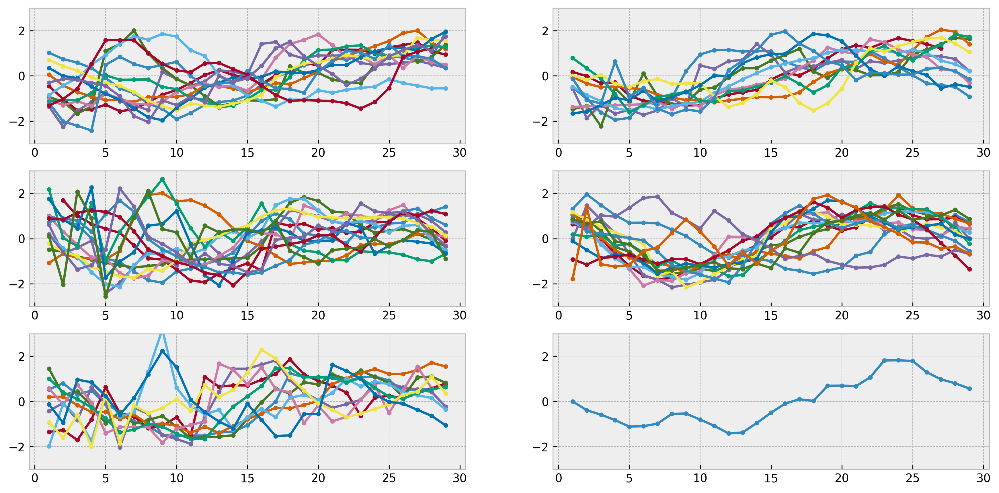

ERROR:tornado.application:Exception in callback functools.partial(<function wrap.<locals>.null_wrapper at 0x11d7169d8>)
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/tornado/ioloop.py", line 605, in _run_callback
    ret = callback()
  File "/anaconda3/lib/python3.6/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 265, in enter_eventloop
    self.eventloop(self)
  File "/anaconda3/lib/python3.6/site-packages/ipykernel/eventloops.py", line 277, in loop_cocoa
    show.mainloop()
AttributeError: 'function' object has no attribute 'mainloop'
ERROR:tornado.application:Exception in callback functools.partial(<function wrap.<locals>.null_wrapper at 0x11e884598>)
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/tornado/ioloop.py", line 605, in _run_callback
    ret = callback()
  File "/anaconda3/lib/

In [113]:
timeSeries = hr_norm_nan.hr_norm.T
timeSeries
plot_clustered_ts(timeSeries,cluster_indeces["cluster"],anim = True, plot = True)

## hierarchical clustering of 5 component PCA

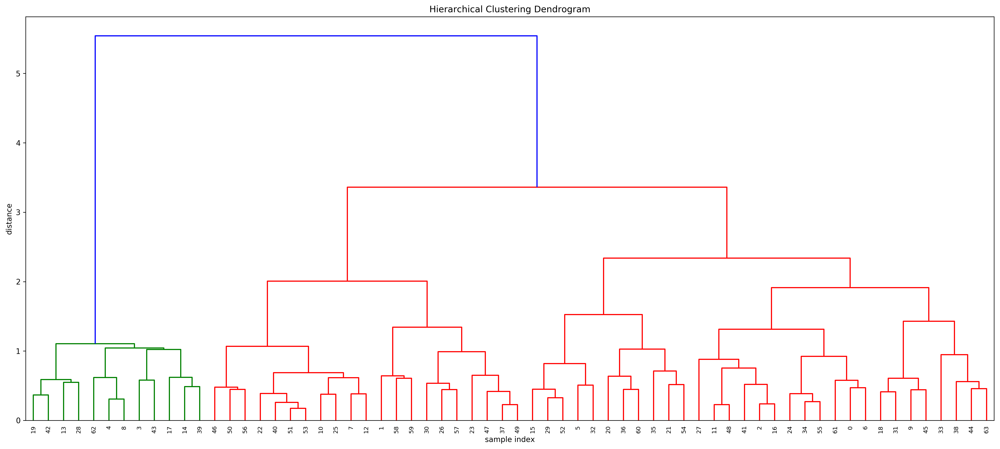

In [114]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import numpy as np

# generate the linkage matrix
Z = linkage(reduced_data, 'complete',"braycurtis")

# calculate full dendrogram
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()

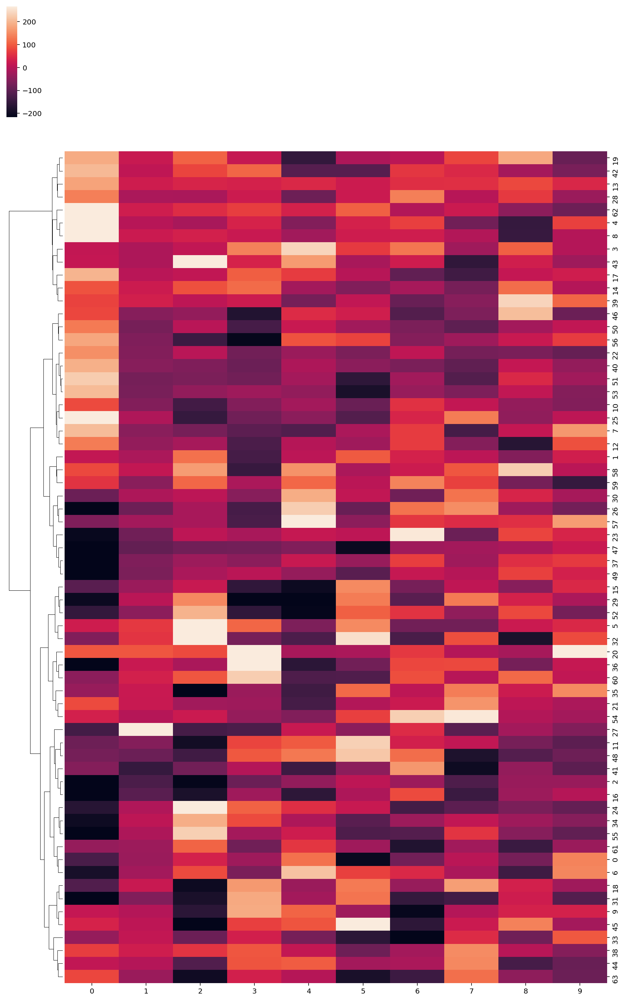

In [115]:
%matplotlib inline
sns.clustermap(reduced_data, robust = True, col_cluster= False, method = "complete", metric = "braycurtis", figsize = (15,25))

In [116]:
k=8
clusters_hierarchical = fcluster(Z, k, criterion='maxclust')

In [117]:
clusters_hierarchical

array([6, 3, 6, 1, 1, 4, 6, 2, 1, 7, 2, 6, 2, 1, 1, 4, 6, 1, 7, 1, 5, 5, 2,
       3, 6, 2, 3, 6, 1, 4, 3, 7, 4, 8, 6, 5, 5, 3, 8, 1, 2, 6, 1, 1, 8, 7,
       2, 3, 6, 3, 2, 2, 4, 2, 5, 6, 2, 3, 3, 3, 5, 6, 1, 8], dtype=int32)

In [118]:
cluster_indeces = pd.concat([pd.DataFrame(clusters_hierarchical), pd.DataFrame(features_finite2.index)], axis = 1)
cluster_indeces["cluster"] = cluster_indeces[0]
cluster_indeces = cluster_indeces.drop(0, axis = 1).set_index("id")
cluster_indeces.head()

,cluster
id,
22,6
23,3
24,6
26,1
27,1


Using matplotlib backend: MacOSX


/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


id
22     6
23     3
24     6
26     1
27     1
30     4
48     6
52     2
54     1
57     7
81     2
83     6
84     2
93     1
99     1
126    4
147    6
175    1
196    7
209    1
210    5
211    5
214    2
225    3
230    6
236    2
250    3
253    6
277    1
282    4
      ..
367    6
379    5
393    5
452    3
468    8
475    1
482    2
490    6
496    1
498    1
500    8
504    7
541    2
542    3
548    6
576    3
604    2
625    2
629    4
633    2
651    5
692    6
712    2
716    3
719    3
725    3
734    5
780    6
782    1
790    8
Name: cluster, Length: 64, dtype: int32

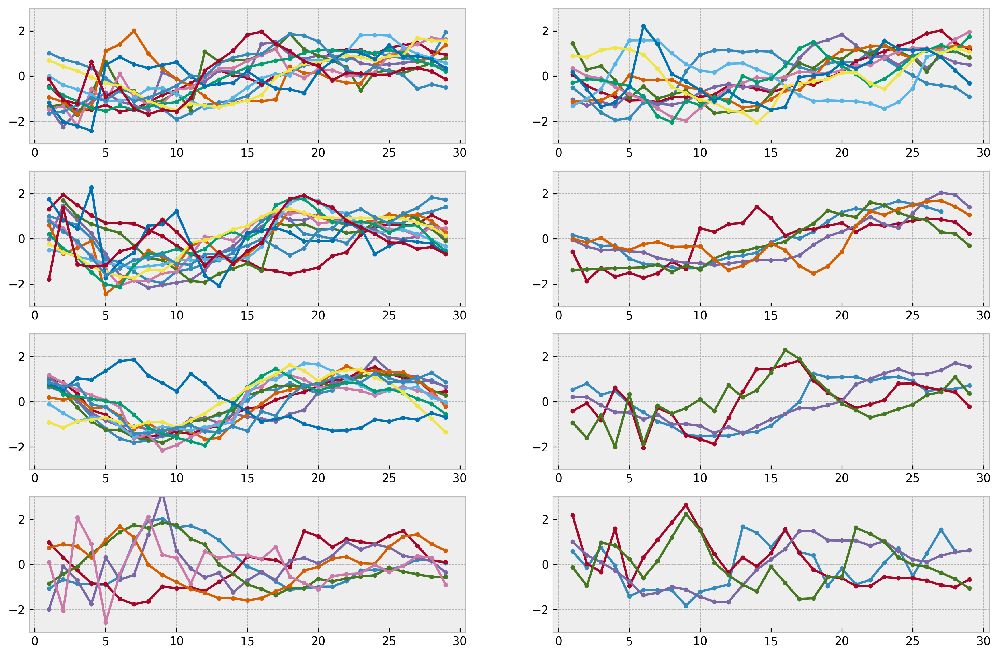

ERROR:tornado.application:Exception in callback functools.partial(<function wrap.<locals>.null_wrapper at 0x11ed67730>)
Traceback (most recent call last):
  File "/anaconda3/lib/python3.6/site-packages/tornado/ioloop.py", line 605, in _run_callback
    ret = callback()
  File "/anaconda3/lib/python3.6/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 265, in enter_eventloop
    self.eventloop(self)
  File "/anaconda3/lib/python3.6/site-packages/ipykernel/eventloops.py", line 277, in loop_cocoa
    show.mainloop()
AttributeError: 'function' object has no attribute 'mainloop'


In [119]:
timeSeries = hr_norm_nan.hr_norm.T
timeSeries
plot_clustered_ts(timeSeries,cluster_indeces["cluster"],anim = True, plot = True)

# hierarchical clustering on tsfresh features & time series

In [28]:
cluster_data = features_finite2.iloc[:, :]
timeSeries = hr_norm_nan.hr_norm.T
print(cluster_data.shape)
print(timeSeries.shape)
cluster_data = pd.concat([cluster_data, timeSeries],axis = 1, join = "inner").fillna(0)
#cluster_data

(64, 13)
(574, 36)


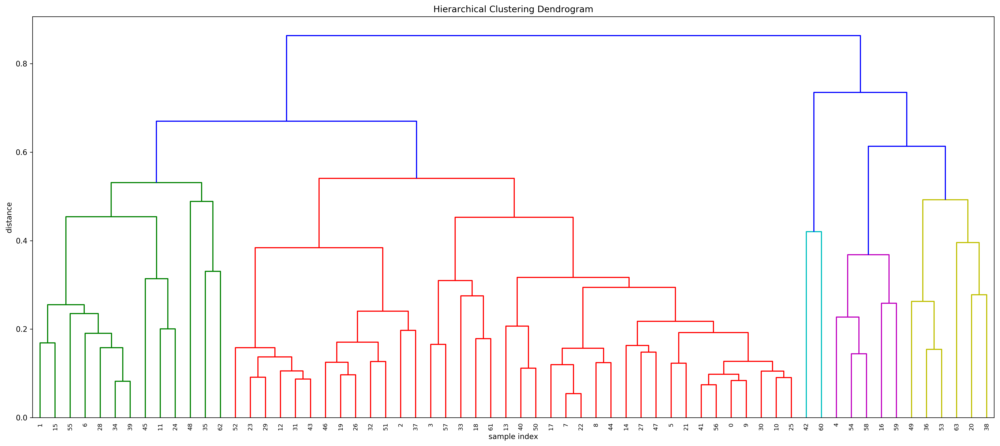

In [36]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import numpy as np

# generate the linkage matrix
Z = linkage(cluster_data, 'complete',"braycurtis")

# calculate full dendrogram
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()

In [37]:
#sns.clustermap(cluster_data, robust = True, col_cluster= False, method = "complete", metric = "braycurtis", figsize = (15,25))

In [38]:
k=8
clusters_hierarchical = fcluster(Z, k, criterion='maxclust')
clusters_hierarchical

array([4, 1, 3, 4, 6, 4, 1, 4, 4, 4, 4, 1, 3, 4, 4, 1, 6, 4, 4, 3, 8, 4, 4,
       3, 1, 4, 3, 4, 1, 3, 4, 3, 3, 4, 1, 2, 7, 3, 8, 1, 4, 4, 5, 3, 4, 1,
       3, 4, 2, 7, 4, 3, 3, 7, 6, 1, 4, 4, 6, 6, 5, 4, 2, 8], dtype=int32)

In [39]:
cluster_indeces = pd.concat([pd.DataFrame(clusters_hierarchical), pd.DataFrame(features_finite2.index)], axis = 1)
cluster_indeces["cluster"] = cluster_indeces[0]
cluster_indeces = cluster_indeces.drop(0, axis = 1).set_index("id")
cluster_indeces.head()

,cluster
id,
22,4
23,1
24,3
26,4
27,6


In [40]:
#plot_clustered_ts(timeSeries,cluster_indeces["cluster"],anim = True, plot = True)

In [48]:
cluster_indeces["braycurtis complete"] = cluster_indeces["cluster"]
cluster_indeces_all["braycurtis complete"] = cluster_indeces["cluster"]
#cluster_indeces_all.to_csv("shape_feature/29/comparison_clusters_differentMethods.csv")


id,22,23,24,26,27,30,48,52,54,57,...,651,692,712,716,719,725,734,780,782,790
euclidean complete,7,1,7,2,8,7,1,1,1,7,...,8,1,7,2,8,4,3,2,2,3
euclidean ward,8,6,8,5,5,8,6,6,6,8,...,5,6,8,5,5,3,2,1,3,2
braycurtis complete,4,1,3,4,6,4,1,4,4,4,...,6,1,4,4,6,6,5,4,2,8


In [59]:
cluster_comparison = cluster_indeces_all.reset_index().groupby(["braycurtis complete", "euclidean complete", "euclidean ward", "id"]).count()

In [62]:
cluster_comparison.reset_index()
#cluster_comparison.to_csv("shape_feature/29/comparison_clusters_differentMethods2.csv")

,braycurtis complete,euclidean complete,euclidean ward,id
0,1,1,6,23
1,1,1,6,48
2,1,1,6,126
3,1,1,6,277
4,1,1,6,367
5,1,1,6,475
6,1,1,6,692
7,1,2,1,83
8,1,2,1,230
9,1,2,1,504
